# Read and Visualize GOSIF: A Global, 0.05-Degree Product of Solar-Induced Chlorophyll Fluorescence Derived from OCO-2, MODIS, and Reanalysis Data


GOSIF is a global, 0.05-degree product of solar-induced chlorophyll fluorescence derived from OCO-2, MODIS, and reanalysis data - https://doi.org/10.3390/rs11050517.

Solar induced chlorophyll fluorescence (SIF) is an electromagnetic signal that is emitted by the chlorophyll of assimilating plants. During photosynthesis, there is a small fraction of energy absorbed by chlorophyll that is not used for photosynthesis, but is emitted later at longer wavelengths as a two-peak spectrum roughly covering the 650–850 nm spectral range. Specifically, the two peaks are at 685 and 740 nm.


## GOSIF Spatial and Temporal Resolution
    - Spatial resolution:  0.05 degree 
    - Spatial extent:      globe
    - Temporal resolution: 8 day (and monthly, annual)
    - Temporal extent:     2000 -2023


## Fair Data Use Policy

There is a fair use policy here: https://data.globalecology.unh.edu/data/GOSIF_v2/Fair_Data_Use_Policy_and_Readme_GOSIF_v2.pdf



## Citation:

Li, X., Xiao, J. (2019) A global, 0.05-degree product of solar-induced chlorophyll fluorescence
derived from OCO-2, MODIS, and reanalysis data. Remote Sensing, 11, 517.
https://doi.org/10.3390/rs11050517. 



## Data Download

The data can be downloaded here:

    - Annual: https://data.globalecology.unh.edu/data/GOSIF_v2/Annual/
    - Monthly: https://data.globalecology.unh.edu/data/GOSIF_v2/Monthly/
    - 8-day: https://data.globalecology.unh.edu/data/GOSIF_v2/8day/



------------------------

DTR


# Import packages

In [1]:
import matplotlib.pyplot as plt

In [2]:
import numpy as np

In [3]:
import xarray as xr

In [4]:
import rioxarray

In [5]:
import cartopy

In [6]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.io.img_tiles as cimgt
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [7]:
import scienceplots

In [8]:
import colorcet as cc # alternative source of colorschemes
#https://colorcet.holoviz.org/getting_started/index.html

In [9]:
import os

# Working Directory

In [10]:
#os.getcwd()

## Data

In [11]:
dir_data = '/media/donald/disk10/DATA_SIF_DATASETS/DATA_GOSIF_v2/DATA/'
dir_data

'/media/donald/disk10/DATA_SIF_DATASETS/DATA_GOSIF_v2/DATA/'

In [12]:
os.listdir(dir_data)[:7]

['GOSIF_2005.M09.tif',
 'GOSIF_2016.M11.tif',
 'GOSIF_2019.M02.tif',
 'GOSIF_2005.M11.tif',
 'GOSIF_2021.M06.tif',
 'GOSIF_2021.M08.tif.gz',
 'GOSIF_2023.M03.tif']

list the files

In [13]:
lst_Files = [fl for fl in os.listdir(dir_data) if fl.endswith('.tif') ]
#lst_Files

In [14]:
os.path.join(dir_data, lst_Files[7] )

'/media/donald/disk10/DATA_SIF_DATASETS/DATA_GOSIF_v2/DATA/GOSIF_2014.M12.tif'

# File size and memory checks

In [15]:
def convert_bytes(byt_num):
    """
    this function will convert bytes to KB, MB, GB and TB
    """
    for x in ['bytes', 'KB', 'MB', 'GB', 'TB']:
        if byt_num < 1024.0:
            return "%3.1f %s" % (byt_num, x)
        byt_num /= 1024.0
    return byt_num
        

In [16]:
def check_filesize(file_path):
    """
    function to check the file size
    """
    if os.path.isfile(file_path):
        file_info = os.stat(file_path)
        return convert_bytes(file_info.st_size)

In [17]:
check_filesize(os.path.join(dir_data, lst_Files[0] ))

'49.9 MB'

# Read the data using Xarray

Often the common choice for reading geotiff files is gdal or rasterio. Here we going to try something different

In [18]:
FILE_NAME = os.path.join(dir_data, lst_Files[0] )
FILE_NAME

'/media/donald/disk10/DATA_SIF_DATASETS/DATA_GOSIF_v2/DATA/GOSIF_2005.M09.tif'

In [19]:
ds_GOSIFv2 = xr.open_dataset(FILE_NAME, decode_coords="all" )

In [20]:
ds_GOSIFv2

<xarray.Dataset> Size: 104MB
Dimensions:      (band: 1, x: 7200, y: 3600)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 58kB -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
  * y            (y) float64 29kB 89.97 89.92 89.88 ... -89.88 -89.93 -89.98
    spatial_ref  int64 8B ...
Data variables:
    band_data    (band, y, x) float32 104MB ...

In [21]:
## can rename the data
ds_GOSIFv2 = ds_GOSIFv2.rename({"band_data":"SIF"})

In [22]:
ds_GOSIFv2

<xarray.Dataset> Size: 104MB
Dimensions:      (band: 1, x: 7200, y: 3600)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 58kB -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
  * y            (y) float64 29kB 89.97 89.92 89.88 ... -89.88 -89.93 -89.98
    spatial_ref  int64 8B ...
Data variables:
    SIF          (band, y, x) float32 104MB ...

data variable name has changed

## shape and dimemsions

In [23]:
ds_GOSIFv2["SIF"].shape

(1, 3600, 7200)

## CRS/Projection

In [24]:
# was the crs/georeference read?
ds_GOSIFv2.rio.crs

CRS.from_epsg(4326)

In [25]:
# if file is not projected
#ds_CSIF.rio.write_crs("epsg:4326", inplace=True)

## Spatial Resolution

What is the spatial resolution?

In [26]:
ds_GOSIFv2.rio.resolution()

(0.05, -0.05)

# Replace fill values for water 

Fill values: 32767 (water bodies) and 32766 (lands under snow/ice throughout the year)

In [27]:
ds_GOSIFv2 = ds_GOSIFv2.where(ds_GOSIFv2['SIF'] != 32767)  
                        # return values != 32767 and assigns nan's for the rest

In [28]:
ds_GOSIFv2 = ds_GOSIFv2.where(ds_GOSIFv2['SIF'] != 32766)  
                        # return values != 32767 and assigns nan's for the rest

In [29]:
ds_GOSIFv2 # it's still a dataset!

<xarray.Dataset> Size: 104MB
Dimensions:      (band: 1, y: 3600, x: 7200)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 58kB -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
  * y            (y) float64 29kB 89.97 89.92 89.88 ... -89.88 -89.93 -89.98
    spatial_ref  int64 8B 0
Data variables:
    SIF          (band, y, x) float32 104MB nan nan nan nan ... nan nan nan nan

# Scale the data to physical SIF units

Scale factor: 0.0001 

Units: W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$

In [30]:
ds_GOSIFv2_INUNITS = ds_GOSIFv2*0.0001

In [31]:
ds_GOSIFv2_INUNITS

<xarray.Dataset> Size: 104MB
Dimensions:      (band: 1, x: 7200, y: 3600)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 58kB -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
  * y            (y) float64 29kB 89.97 89.92 89.88 ... -89.88 -89.93 -89.98
    spatial_ref  int64 8B 0
Data variables:
    SIF          (band, y, x) float32 104MB nan nan nan nan ... nan nan nan nan

In [32]:
np.unique( ds_GOSIFv2_INUNITS['SIF'].values )

array([-0.0694, -0.0673, -0.0633, ...,  0.7373,  0.7672,     nan],
      dtype=float32)

# Quick plot

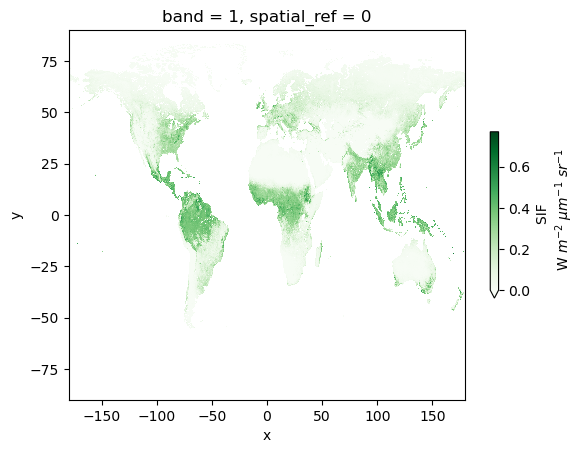

In [33]:
ds_GOSIFv2_INUNITS['SIF'].plot(cmap=plt.cm.Greens, vmin=0, vmax=0.77, 
                               cbar_kwargs={"label": "SIF \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$",
                                            'shrink':0.45})

# Plot the data - Single Image

In [ ]:
#stamen_terrain = cimgt.Stamen('terrain-background')

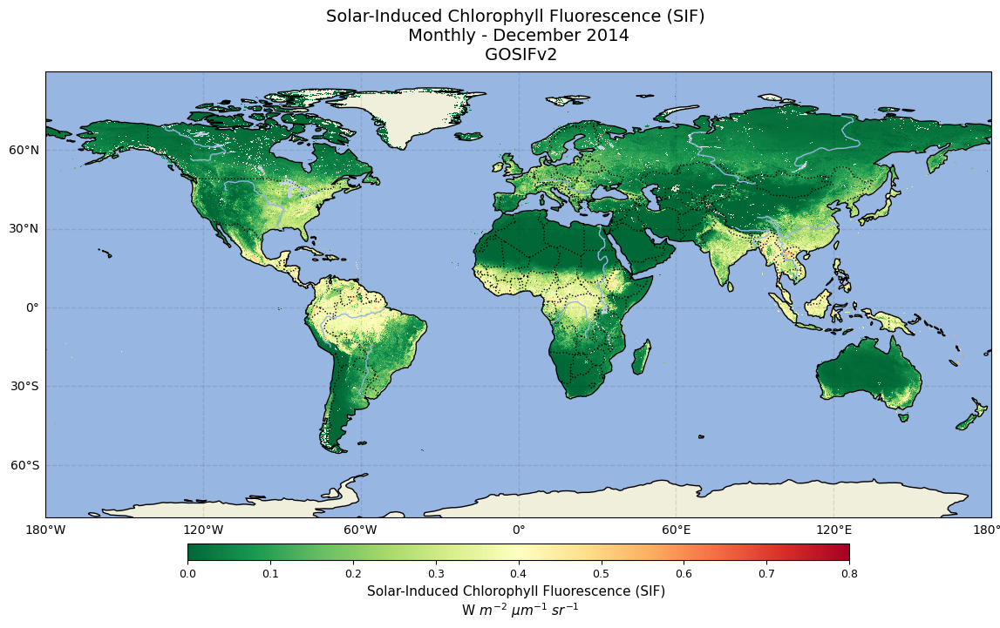

In [34]:
# some parameters

# pad: Fraction of original Axes between colorbar and new image Axes.
cbar_pad = 0.035  # space between colobar and figure



###################
fig = plt.figure()
fig.set_size_inches(14, 11)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
#set_extent(extents, crs=None)[source]
#Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
#If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
#version of this axes’ projection.
ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
## add features
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)
### add background
#ax.add_image(stamen_terrain, 8)
### add data
#ds_GOSIFv2_INUNITS['SIF'].plot(cmap=plt.cm.RdYlGn_r, vmin=0, vmax=0.8,
#                               cbar_kwargs={"label": "SIF \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$",
#                                            'shrink':0.45})

im_sif = ds_GOSIFv2_INUNITS['SIF'].plot(cmap=plt.cm.RdYlGn_r, vmin=0, vmax=0.8, add_colorbar=False)

## add colorbar inorder to control colobar
cb2 = plt.colorbar(im_sif, orientation= 'horizontal', pad=cbar_pad, 
                   shrink=0.7, aspect=40) #, extend='both'
# since fig.axes is not being used, aspect is used to manage the width of the colorbar
cb2.set_label(label = "Solar-Induced Chlorophyll Fluorescence (SIF) \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$", 
              fontsize=11)
cb2.ax.tick_params(labelsize=9)
##########
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                  linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
#gl.ylines = True
#gl.xlines = True

###
ax.set_title('Solar-Induced Chlorophyll Fluorescence (SIF) \n Monthly - December 2014 \n GOSIFv2',
             fontsize =14,
             y=1.01)


plt.show()


Can improve the ocean color to match what is some Journal papers

In [35]:
ocean_color = np.float64([209,230,241])/255 # color that you see in some Journal papers

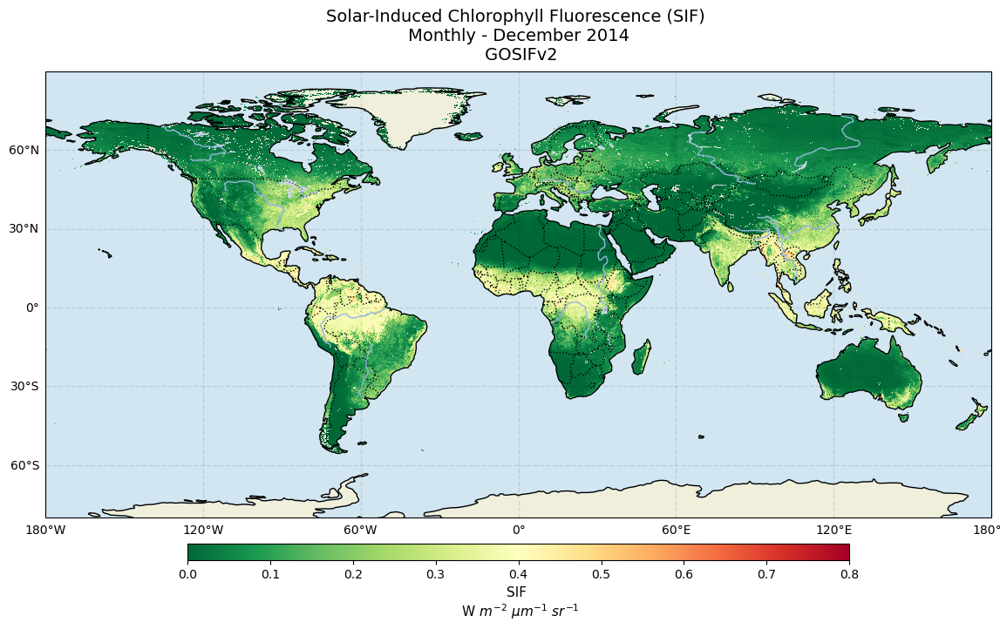

In [36]:
fig = plt.figure()
fig.set_size_inches(14, 11)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
#set_extent(extents, crs=None)[source]
#Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
#If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
#version of this axes’ projection.
ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
## add features
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN, color=ocean_color, edgecolor='k')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)
### add data
#ds_GOSIFv2_INUNITS['SIF'].plot(cmap=plt.cm.RdYlGn_r,vmin=0, vmax=0.8, extend='None',
#                               cbar_kwargs={"label": "SIF \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$",
#                                            'shrink':0.45})

## for more control
im_sif2 = ds_GOSIFv2_INUNITS['SIF'].plot(ax=ax, cmap=plt.cm.RdYlGn_r,vmin=0, vmax=0.8, 
                                         add_colorbar=False )

## add colorbar inorder to control colobar
cb2 = plt.colorbar(im_sif2, orientation= 'horizontal', pad=cbar_pad, 
                   shrink=0.7, aspect=40) #, extend='both'
# since fig.axes is not being used, aspect is used to manage the width of the colorbar
cb2.set_label(label = "SIF \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$", fontsize=11)
cb2.ax.tick_params(labelsize=10)


#plt.colorbar().set_title('',fontsize=8)
##########
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
#gl.ylines = True
#gl.xlines = True
###
ax.set_title('Solar-Induced Chlorophyll Fluorescence (SIF) \n Monthly - December 2014 \n GOSIFv2',
             fontsize=14,
             y=1.01)

plt.show()

# Different Color Schemes

Matplotlib comes with a good set of color schemes and you also come up with your own schemes. However, in terms of pre-packaged schemes, matplotlib is not the only source of color schemes. *colorcet* provides an alternative set of colorschemes. Visit the webpage: https://colorcet.holoviz.org/getting_started/index.html

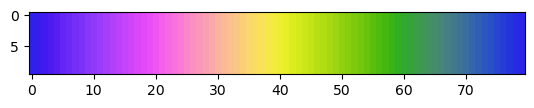

In [37]:
xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
plt.imshow(xs, cmap=cc.cm.colorwheel);  # use tab completion to choose

now plot using a colorcet color scheme

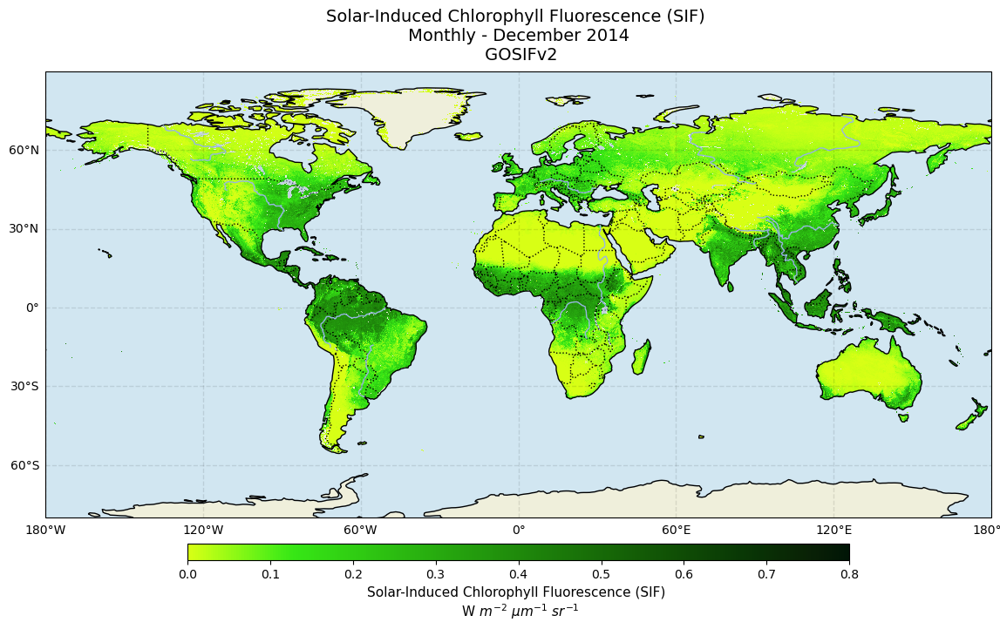

In [38]:
## Parameters to use

use_this_cmap = cc.cm.CET_L5_r    #cc.cm.CET_L16_r  <-- OK  
#https://colorcet.holoviz.org/user_guide/Continuous.html

# pad: Fraction of original Axes between colorbar and new image Axes.
cbar_pad = 0.035  # space between colobar and figure

#############################################
fig = plt.figure()
fig.set_size_inches(14, 11)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
#set_extent(extents, crs=None)[source]
#Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
#If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
#version of this axes’ projection.
ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
## add features
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN, color=ocean_color, edgecolor='k')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)
### add data
#ds_GOSIFv2_INUNITS['SIF'].plot(cmap=plt.cm.RdYlGn_r,vmin=0, vmax=0.8, extend='None',
#                               cbar_kwargs={"label": "SIF \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$",
#                                            'shrink':0.45})

## for more control
im_sif2 = ds_GOSIFv2_INUNITS['SIF'].plot(ax=ax, cmap= use_this_cmap,
                                         vmin=0, vmax=0.8, 
                                         add_colorbar=False )

## add colorbar inorder to control colobar
cb2 = plt.colorbar(im_sif2, orientation= 'horizontal', pad=cbar_pad, 
                   shrink=0.7, aspect=40) #, extend='both'
cb2.set_label(label = "Solar-Induced Chlorophyll Fluorescence (SIF) \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$", 
              fontsize=11)
cb2.ax.tick_params(labelsize=10)


#plt.colorbar().set_title('',fontsize=8)
##########
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                  linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
#gl.ylines = True
#gl.xlines = True

###
ax.set_title('Solar-Induced Chlorophyll Fluorescence (SIF) \n Monthly - December 2014 \n GOSIFv2',
             fontsize =14,
             y=1.01)


plt.show()

# Science-y Plots

If you have a science background or work in research, you can use the python package _sceinceplots_ to produce figures formatted according to IEEE, Nature etc standards

You use the _with_ keyword

In [ ]:
# to see some of the availble styles, uncomment the next line and run the code box
#scienceplots.stylesheets

In [ ]:
# or look at the examples here:
#https://github.com/garrettj403/SciencePlots/blob/master/examples/plot-examples.py

## IEEE 

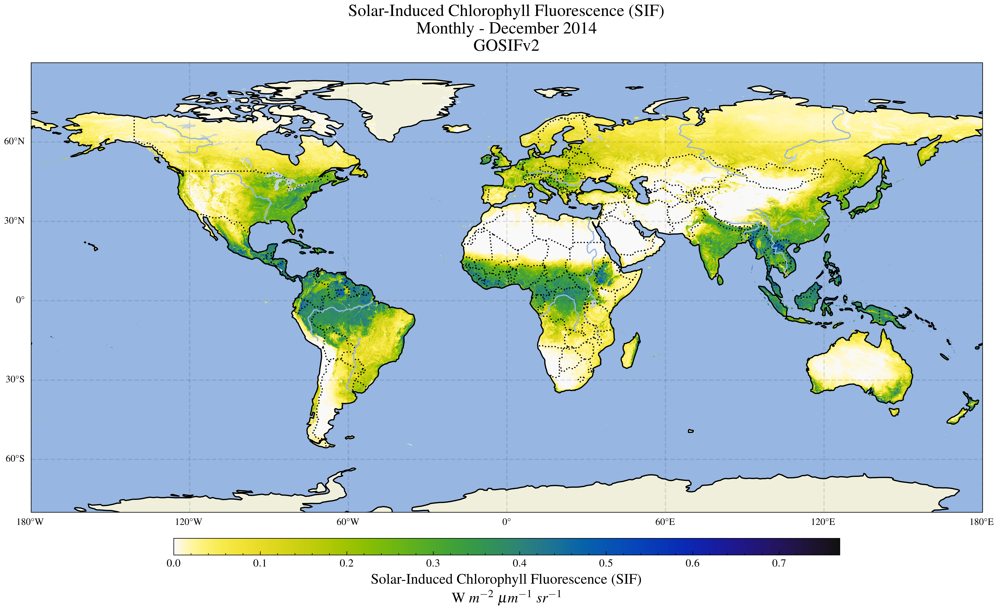

In [39]:
#### To ieee standard
## Parameters for Fig
use_this_cmap = cc.cm.CET_L16_r  #plt.cm.RdYlBu_r
#https://colorcet.holoviz.org/user_guide/Continuous.html

#to ieee standard
with plt.style.context(['science', 'ieee']):
    
    fig = plt.figure()
    fig.set_size_inches(14, 11)
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    #set_extent(extents, crs=None)[source]
    #Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
    #If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
    #version of this axes’ projection.
    ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
    ## add features
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)
    ### add background
    #ax.add_image(stamen_terrain, 8)
    ### add data
    im_ieee = ds_GOSIFv2_INUNITS['SIF'].plot(ax=ax, cmap= use_this_cmap, vmin=0, vmax=0.77,
                                             add_colorbar=False)

    
    ## add colorbar inorder to control colobar
    cb = plt.colorbar(im_ieee, orientation= 'horizontal', pad=cbar_pad, 
                      shrink=0.7, aspect=40) #, extend='both'
    cb.set_label(label = "Solar-Induced Chlorophyll Fluorescence (SIF) \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$", 
                 fontsize=12)
    cb.ax.tick_params(labelsize=9)
    
    
    
    #plt.colorbar().set_title('',fontsize=8)
    ##########
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                      linestyle="--")
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    #gl.ylines = True
    #gl.xlines = True

    ###
    ax.set_title('Solar-Induced Chlorophyll Fluorescence (SIF) \n Monthly - December 2014 \n GOSIFv2',
                 fontsize = 14,
                 y=1.01)


    plt.show()

## Nature

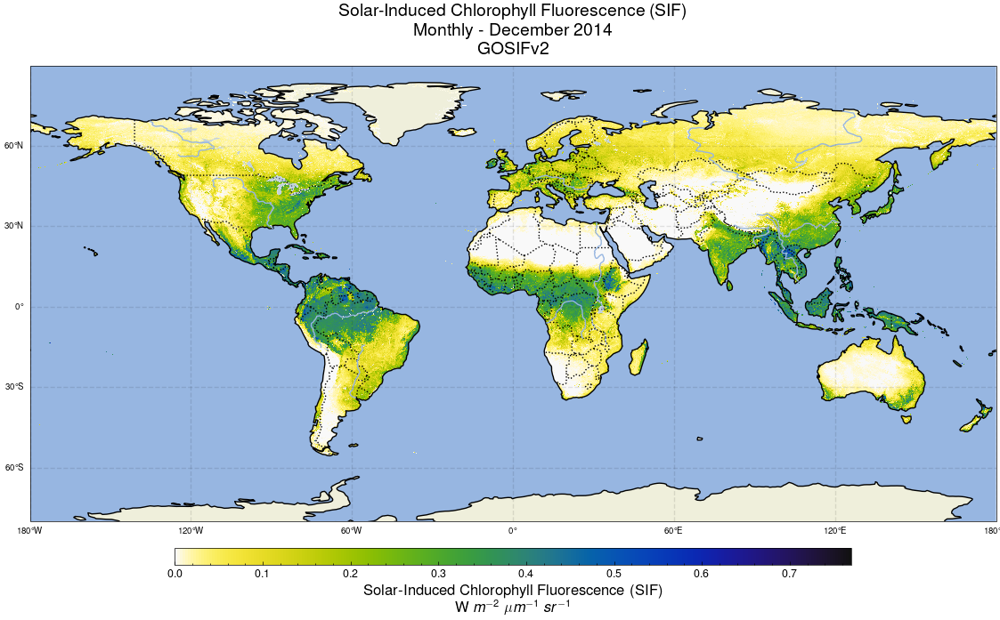

In [40]:
#### to Nature standard

## Parameters for Fig
use_this_cmap = cc.cm.CET_L16_r  #plt.cm.RdYlBu_r
#https://colorcet.holoviz.org/user_guide/Continuous.htm

#to Nature standard
with plt.style.context(['science', 'nature']):
    
    fig = plt.figure()
    fig.set_size_inches(14, 11)
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    #set_extent(extents, crs=None)[source]
    #Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
    #If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
    #version of this axes’ projection.
    ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
    ## add features
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)
    ### add background
    #ax.add_image(stamen_terrain, 8)
    ### add data
    im_natur = ds_GOSIFv2_INUNITS['SIF'].plot(ax=ax, cmap= use_this_cmap, vmin=0, vmax=0.77,
                                              add_colorbar=False )
    ## add colorbar inorder to control colobar
    cb = plt.colorbar(im_natur, orientation= 'horizontal', pad=cbar_pad, 
                      shrink=0.7, aspect=40) #, extend='both'
    cb.set_label(label = "Solar-Induced Chlorophyll Fluorescence (SIF) \n W $m^{−2}$ $\mu m^{−1}$ $sr^{−1}$", 
                  fontsize=12)
    cb.ax.tick_params(labelsize=9)
    ##########
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                      linestyle="--")
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    #gl.ylines = True
    #gl.xlines = True
    ###
    ax.set_title('Solar-Induced Chlorophyll Fluorescence (SIF) \n Monthly - December 2014 \n GOSIFv2',
                 fontsize = 14,
                 y=1.01)


    plt.show()